<a href="https://colab.research.google.com/github/Mewmp55/DADS7202HW02/blob/main/Homework2_faster_rcnn_resnet50_v1_640x640_2000_steps.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

****This work is to try to create an object detection model using Tensorflow,following the steps of  [TensorFlow 2 Object Detection API tutorial](https://tensorflow-object-detection-api-tutorial.readthedocs.io/en/latest/index.html) and YouTube Chanel [Krish Naik](https://www.youtube.com/watch?v=XoMiveY_1Z4) video.****

### ***Prepare DATASET***




---


* Prepare the images you want to use in the folder.

  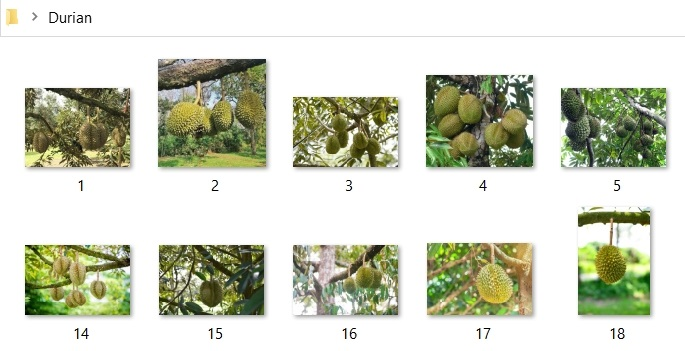



---

* Go to the [roboflow](https://roboflow.com/) website.
* Sign up for a new account then sign in.
* Create new project and select project type as object detection.

  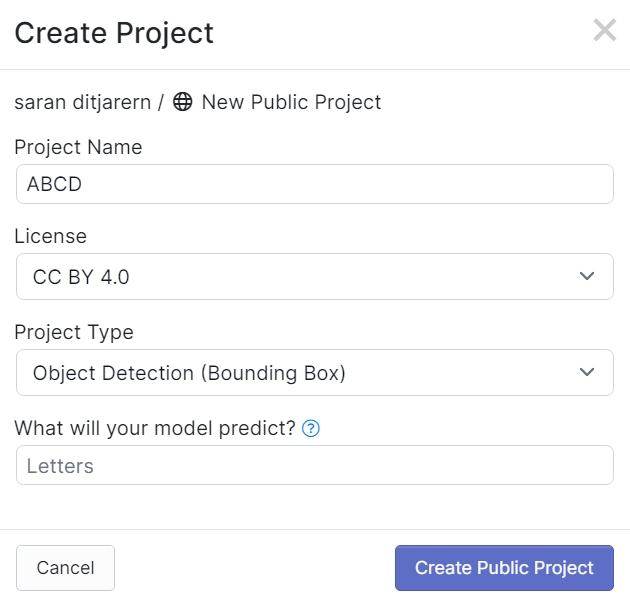



---

* Upload image to project

  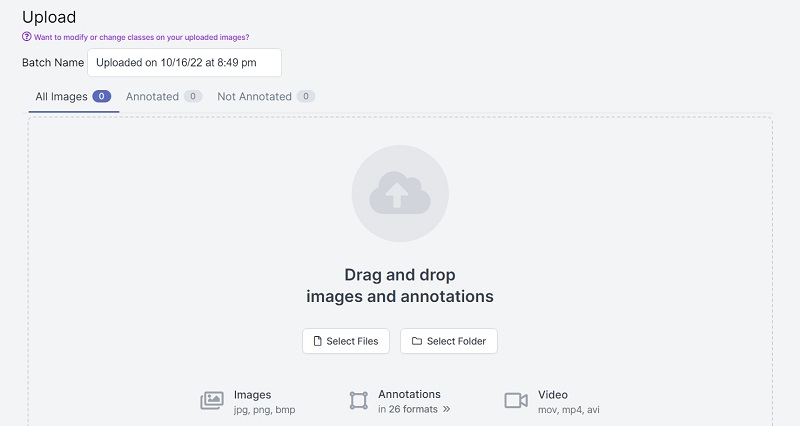



---

* Finishing upload 

  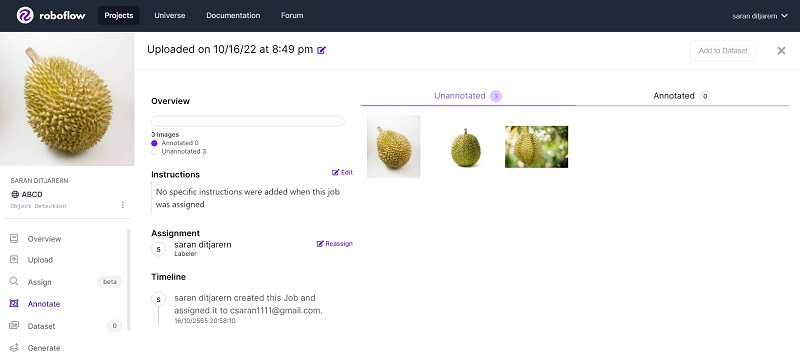



---

* Annotate images

  * Click on the image to annotate, then drag a frame around the object's area and classify it.
  * Go to the next image and repeat previous step to all images.

  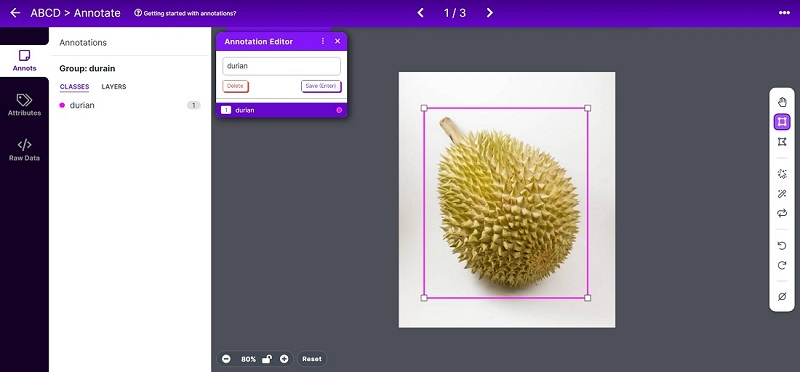



---


* Add images to dataset
  * Click the **Add n images to Dataset** at the top right of the website.
  * Choose the method adjust required value ,then click add images.
  
  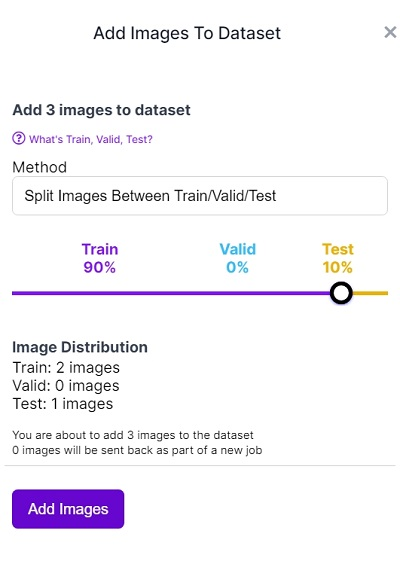



---

* Generate new version of Dataset
  * Click the generate button at the bottom left of the screen.
  * In Section 3.Preprocessing Can be used to resize the image, and in Section 4. It can be used to do Augmentation and then generate a new dataset immediately in Section 5.

  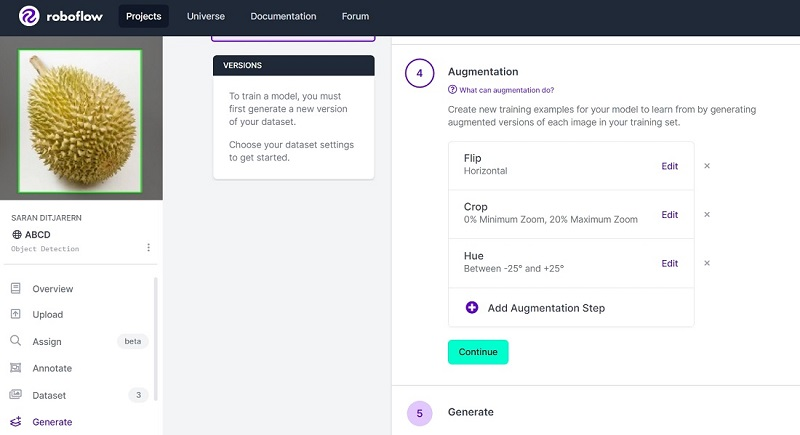



---

* Export dataset

  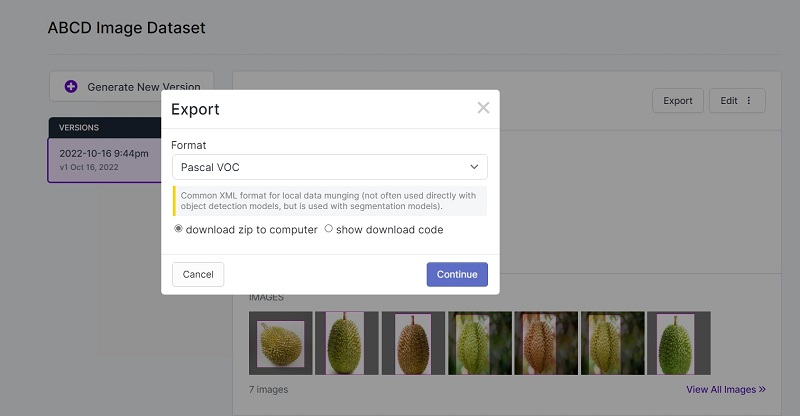

###***Install Tensorflow***

In [ ]:
!pip install tensorflow-gpu

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 578.0 MB 15 kB/s 
     |████████████████████████████████| 5.9 MB 74.6 MB/s 
     |████████████████████████████████| 1.7 MB 75.4 MB/s 
     |████████████████████████████████| 438 kB 89.2 MB/s 
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.9.0
    Uninstalling tensorflow-estimator-2.9.0:
      Successfully uninstalled tensorflow-estimator-2.9.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.9.1
    Uninstalling tensorboard-2.9.1:
      Successfully uninstalled tensorboard-2.9.1
  Attempting uninstall: keras
    Found existing installation: keras 2.9.0
    Uninstalling keras-2.9.0:
      Successfully uninstalled keras-2.9.0
  Attempting uninstall: flatbuffers
    Found existing installation: flatbuffers 1.12
    Uninstalling flatbuffers-1.12:
      Successfully u

In [ ]:
import tensorflow as tf
print(tf.__version__)

2.10.0


In [ ]:
import sys
print( f"Python {sys.version}\n" )

import numpy as np
print( f"NumPy {np.__version__}\n" )

import matplotlib.pyplot as plt
%matplotlib inline

import tensorflow as tf
print( f"TensorFlow {tf.__version__}" )
print( f"tf.keras.backend.image_data_format() = {tf.keras.backend.image_data_format()}" )

# Count the number of GPUs as detected by tensorflow
gpus = tf.config.list_physical_devices('GPU')
print( f"TensorFlow detected { len(gpus) } GPU(s):" )
for i, gpu in enumerate(gpus):
  print( f".... GPU No. {i}: Name = {gpu.name} , Type = {gpu.device_type}" )

Python 3.7.15 (default, Oct 12 2022, 19:14:55) 
[GCC 7.5.0]

NumPy 1.21.6

TensorFlow 2.10.0
tf.keras.backend.image_data_format() = channels_last
TensorFlow detected 1 GPU(s):
.... GPU No. 0: Name = /physical_device:GPU:0 , Type = GPU


###  ***Cloning TFOD 2.0 Github to drive***



---


* Mounting Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive




---


* Go to the folder symbol on the left side of the screen.
* Create the folder you want to clone the repository into.

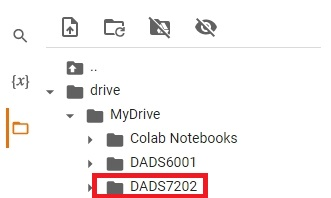



---


* Change directory to your folder.

In [ ]:
cd /content/drive/MyDrive/DADS7202

/content/drive/MyDrive/DADS7202


In [ ]:
!git clone https://github.com/tensorflow/models.git

Cloning into 'models'...
remote: Enumerating objects: 78130, done.
remote: Counting objects: 100% (538/538), done.
remote: Compressing objects: 100% (249/249), done.
remote: Total 78130 (delta 321), reused 470 (delta 285), pack-reused 77592
Receiving objects: 100% (78130/78130), 593.57 MiB | 22.12 MiB/s, done.
Resolving deltas: 100% (55459/55459), done.
Checking out files: 100% (3197/3197), done.




---


* Cloning Tensorflow github repository
* In the created folder, you will see a new folder.

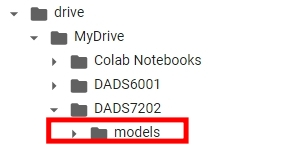



---


* In the **models folder** ,go to **research** folder ,then go to the **object_detection** folder and download files **export_tflite_graph_tf2.py** ,  **exporter_main_v2.py** and **model_main_tf2.py** .

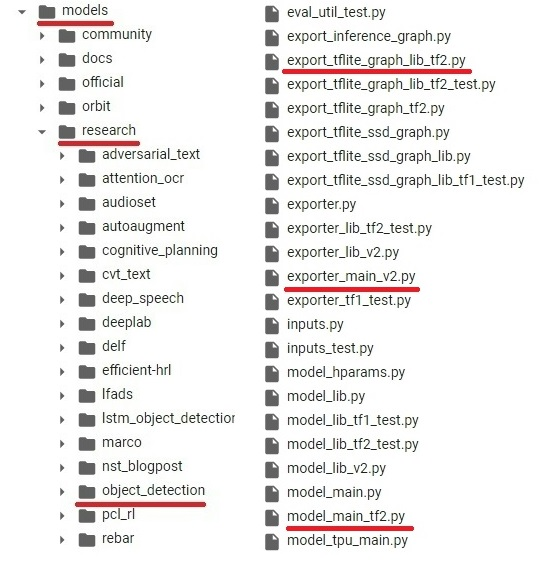

### ***COCO API installation***



---


* Change directory to **research** folder

In [ ]:
cd /content/drive/MyDrive/DADS7202/models/research

/content/drive/MyDrive/DADS7202/models/research




---


*  install coco API

In [ ]:
!protoc object_detection/protos/*.proto --python_out=.

In [ ]:
!git clone https://github.com/cocodataset/cocoapi.git

Cloning into 'cocoapi'...
remote: Enumerating objects: 975, done.
remote: Total 975 (delta 0), reused 0 (delta 0), pack-reused 975
Receiving objects: 100% (975/975), 11.72 MiB | 19.09 MiB/s, done.
Resolving deltas: 100% (576/576), done.


In [ ]:
cd cocoapi/PythonAPI

/content/drive/MyDrive/DADS7202/models/research/cocoapi/PythonAPI


In [ ]:
!make

python setup.py build_ext --inplace
running build_ext
cythoning pycocotools/_mask.pyx to pycocotools/_mask.c
/usr/local/lib/python3.7/dist-packages/Cython/Compiler/Main.py:369: FutureWarning: Cython directive 'language_level' not set, using 2 for now (Py2). This will change in a later release! File: /content/drive/MyDrive/DADS7202/models/research/cocoapi/PythonAPI/pycocotools/_mask.pyx
  tree = Parsing.p_module(s, pxd, full_module_name)
building 'pycocotools._mask' extension
creating build
creating build/common
creating build/temp.linux-x86_64-3.7
creating build/temp.linux-x86_64-3.7/pycocotools
x86_64-linux-gnu-gcc -pthread -Wno-unused-result -Wsign-compare -DNDEBUG -g -fwrapv -O2 -Wall -g -fstack-protector-strong -Wformat -Werror=format-security -g -fwrapv -O2 -g -fstack-protector-strong -Wformat -Werror=format-security -Wdate-time -D_FORTIFY_SOURCE=2 -fPIC -I/usr/local/lib/python3.7/dist-packages/numpy/core/include -I../common -I/usr/include/python3.7m -c ../common/maskApi.c -o buil

In [ ]:
cp -r pycocotools /content/drive/MyDrive/DADS7202/models/research

### ***Object Detection API installation***



---


* Back to **research** folder

In [ ]:
cd /content/drive/MyDrive/DADS7202/models/research

/content/drive/MyDrive/DADS7202/models/research




---


*  installing the object detection package

In [ ]:
cp object_detection/packages/tf2/setup.py .

In [ ]:
#python -m pip install --use-feature=2020-resolver .

In [ ]:
!python -m pip install .

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/drive/MyDrive/DADS7202/models/research
  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
     |████████████████████████████████| 11.0 MB 7.7 MB/s 
     |████████████████████████████████| 352 kB 83.4 MB/s 
     |████████████████████████████████| 2.2 MB 41.4 MB/s 
     |████████████████████████████████| 25.0 MB 1.5 MB/s 
     |████████████████████████████████| 67 kB 7.0 MB/s 
     |████████████████████████████████| 116 kB 91.2 MB/s 
     |████████████████████████████████| 636 kB 86.1 MB/s 
     |████████████████████████████████| 99



---


* Test Installation

In [ ]:
!python object_detection/builders/model_builder_tf2_test.py

2022-10-19 13:14:08.150820: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-10-19 13:14:08.945325: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-10-19 13:14:08.945426: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-10-19 13:14:08.945444: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed p

### ***Training Custom Object Detector***

#### Preparing the Workspace



---


* In the DADS7202 folder (or other created folder in cloning TFOD github step), create a workspace folder and a subfolder, as shown below.

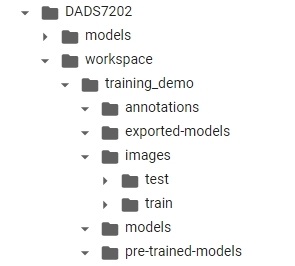



---


* In the **annotations** folder right click + new file create **label_map.pbtxt**
  * double click on label_map.pbtxt and edit the label

   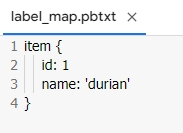



---


* In the **test** and **train** folders, upload the images to use train and test the model. In this work uses JPG+XML files.

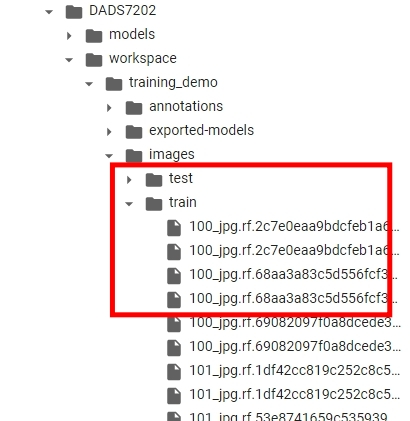



---


* Change directory to pre-trained-models folder

In [ ]:
cd /content/drive/MyDrive/DADS7202/workspace/training_demo/pre-trained-models

/content/drive/MyDrive/DADS7202/workspace/training_demo/pre-trained-models




---


* Download Pre-Trained Model which are listed in [TensorFlow 2 Detection Model Zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md) .
* In this work we try to use Pre-Train model as **Faster R-CNN ResNet50 V1 640x640**.

In [ ]:
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz

--2022-10-18 14:57:46--  http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 108.177.111.128, 2607:f8b0:4001:c07::80
Connecting to download.tensorflow.org (download.tensorflow.org)|108.177.111.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 211996178 (202M) [application/x-tar]
Saving to: ‘faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz’

faster_rcnn_resnet5 100%[===================>] 202.17M  88.0MB/s    in 2.3s    

2022-10-18 14:57:48 (88.0 MB/s) - ‘faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz’ saved [211996178/211996178]





---


* extracted our pre-trained model and The **pre-trained-model** folder should look like this.

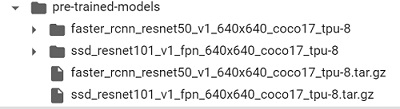

In [ ]:
!tar -xvf faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz

faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/checkpoint/
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/checkpoint/ckpt-0.data-00000-of-00001
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/checkpoint/checkpoint
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/checkpoint/ckpt-0.index
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/pipeline.config
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/saved_model/
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/saved_model/saved_model.pb
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/saved_model/variables/
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/saved_model/variables/variables.data-00000-of-00001
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/saved_model/variables/variables.index




---

* In the **training-demo** folder, upload the previously downloaded files **export_tflite_graph_tf2.py** , **exporter_main_v2.py** and **model_main_tf2.py** .
  * This step is for easier to call this script
  * Able to call the script in research folder without download and re-upload step

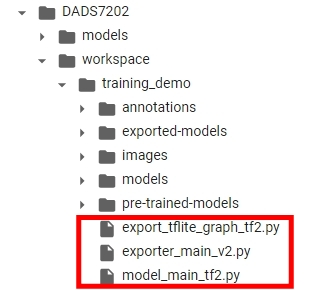



---

* Download **partition_dataset.py** and **generate_tfrecord.py**
  * Go to [TensorFlow 2 Object Detection API tutorial](https://tensorflow-object-detection-api-tutorial.readthedocs.io/en/latest/training.html)
  * Download **Partition Dataset script** ,then partition the Dataset. (In this work we skip this step because we preprocessing dataset on [Roboflow](https://roboflow.com/) already.)
  * Download **Generate TensorFlow Records script**
  * Upload file into **training_demo** folder

  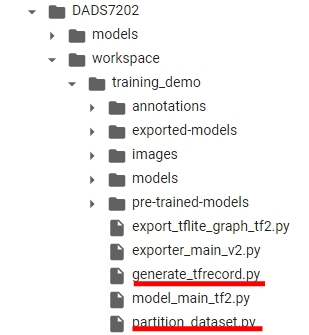



---


* Create TensorFlow Records
  * Change directory to **training_demo**
  * Run **generate_tfrecord.py** script to create tensorflow records
  * Check the  train folder, test folder, label_map.pbtxt and the ourput path before running. 

In [ ]:
cd /content/drive/MyDrive/DADS7202/workspace/training_demo

/content/drive/MyDrive/DADS7202/workspace/training_demo


In [ ]:
# Create train data:
!python generate_tfrecord.py -x /content/drive/MyDrive/DADS7202/workspace/training_demo/images/train -l /content/drive/MyDrive/DADS7202/workspace/training_demo/annotations/label_map.pbtxt -o /content/drive/MyDrive/DADS7202/workspace/training_demo/annotations/train.record

# Create test data:
!python generate_tfrecord.py -x /content/drive/MyDrive/DADS7202/workspace/training_demo/images/test -l //content/drive/MyDrive/DADS7202/workspace/training_demo/annotations/label_map.pbtxt -o /content/drive/MyDrive/DADS7202/workspace/training_demo/annotations/test.record

2022-10-18 14:34:23.832100: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-10-18 14:34:26.547365: E tensorflow/stream_executor/cuda/cuda_driver.cc:265] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
Successfully created the TFRecord file: /content/drive/MyDrive/DADS7202/workspace/training_demo/annotations/train.record
2022-10-18 14:34:32.395988: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-10-18 14:34:34.868190: E tensorflow/stream_executor/cuda/cuda_driver.cc:265] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
Successfully created the TFRecord file: /content/drive/MyDrive/DADS7202/workspace/training_demo/annotations/test.record




---

* The annotations folder should be look like this.

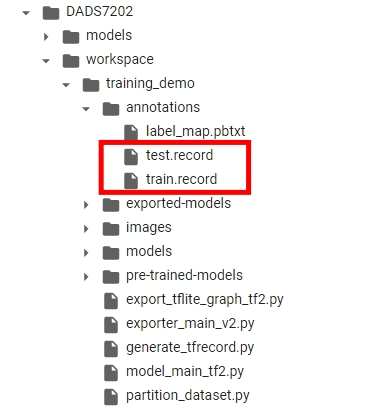



---


* In **models** folder **(inside training_demo folder)**  create a new directory named **Faster_R-CNN-ResNet50_V1_2** and download **pipeline.config** from **pre-train-models/fater_rcnn_resnet50...** ,then re-upload to the newly created directory. Our **training_demo** should now look like this:

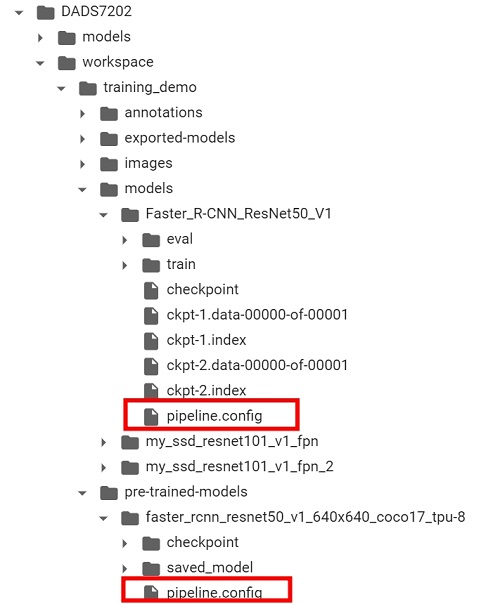



---


* Configure the Training Pipeline
  * Double click into pipeline.config in **models/Faster_R-CNN_ResNet50_V1**
  * **Looking at line 10, let's change the number of different label classes.**
  * Line 13,14 can set image resizer height and width.
  * **Line 93 to set batch size.**
  * **Line 97,103 change number of step**
  * **Line 113 change the Path to checkpoint of pre-trained model**
  * **Line 114 change fine tune checkpoint type to detection**
  * **Line 122 set it to false**
  * **Line 126 change Path to label map file**
  * **Line 128 change Path to training TFRecord file**
  * **Line 139 change Path to label map file**
  * **Line 143 change Path to testing TFRecord**

  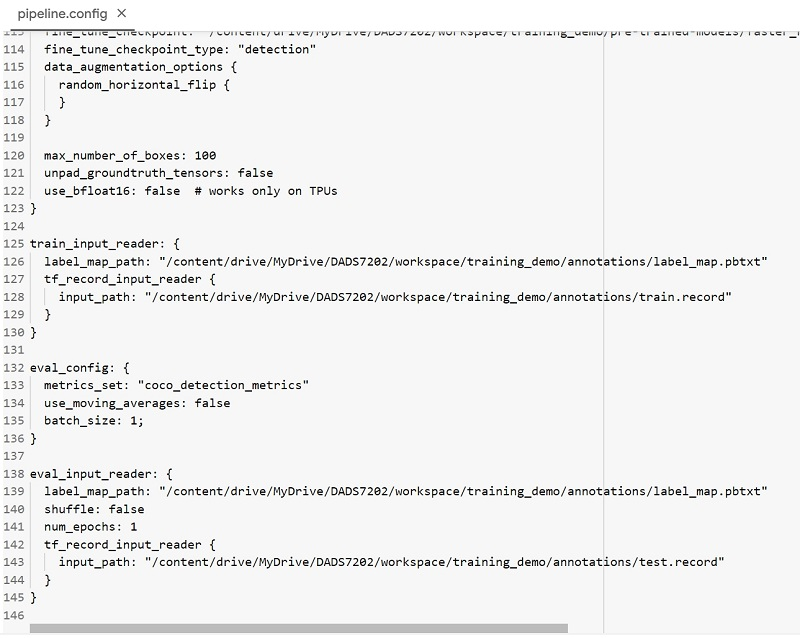

#### Training the model



---


* Change directory to training_demo

In [ ]:
cd /content/drive/MyDrive/DADS7202/workspace/training_demo

/content/drive/MyDrive/DADS7202/workspace/training_demo




---


* Training the model

In [ ]:
!python model_main_tf2.py --model_dir=/content/drive/MyDrive/DADS7202/workspace/training_demo/models/Faster_R-CNN_ResNet50_V1_2 --pipeline_config_path=/content/drive/MyDrive/DADS7202/workspace/training_demo/models/Faster_R-CNN_ResNet50_V1_2/pipeline.config

2022-10-19 13:17:01.244336: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-10-19 13:17:02.043131: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-10-19 13:17:02.043225: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-10-19 13:17:02.043243: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed p

###***Evaluating the Model***



---


* Set metric type

In [ ]:
from object_detection.protos import eval_pb2
eval_config = eval_pb2.EvalConfig()
eval_config.metrics_set.extend(['coco_detection_metrics'])



---


* Change directory to training_demo

In [ ]:
cd /content/drive/MyDrive/DADS7202/workspace/training_demo

/content/drive/MyDrive/DADS7202/workspace/training_demo




---


* Model evaluate using Tensorboard

In [ ]:
!python model_main_tf2.py --model_dir=/content/drive/MyDrive/DADS7202/workspace/training_demo/models/Faster_R-CNN_ResNet50_V1_2 --pipeline_config_path=/content/drive/MyDrive/DADS7202/workspace/training_demo/models/Faster_R-CNN_ResNet50_V1_2/pipeline.config --checkpoint_dir=/content/drive/MyDrive/DADS7202/workspace/training_demo/models/Faster_R-CNN_ResNet50_V1_2

2022-10-19 13:29:24.171780: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-10-19 13:29:24.969006: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-10-19 13:29:24.969115: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-10-19 13:29:24.969132: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed p

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=/content/drive/MyDrive/DADS7202/workspace/training_demo/models/Faster_R-CNN_ResNet50_V1_2

<IPython.core.display.Javascript object>

###***Inferencing Trained Models***





---

* In exported-models folder create my_model folder
* Export the model to /content/drive/MyDrive/DADS7202/workspace/training_demo/exported-models/my_model

In [ ]:
!python exporter_main_v2.py --input_type image_tensor --pipeline_config_path /content/drive/MyDrive/DADS7202/workspace/training_demo/models/Faster_R-CNN_ResNet50_V1_2/pipeline.config --trained_checkpoint_dir /content/drive/MyDrive/DADS7202/workspace/training_demo/models/Faster_R-CNN_ResNet50_V1_2 --output_directory /content/drive/MyDrive/DADS7202/workspace/training_demo/exported-models/my_model4_faster_R_CNN_2000

2022-10-19 13:33:21.278849: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-10-19 13:33:22.069985: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-10-19 13:33:22.070089: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-10-19 13:33:22.070107: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed p



---

* Inferencing trained model

Loading model...Done! Took 9.365224361419678 seconds
Running inference for /content/drive/MyDrive/DADS7202/workspace/training_demo/images/test/1_jpg.rf.24fda645c9751b1f97ca006a4c164020.jpg... Done


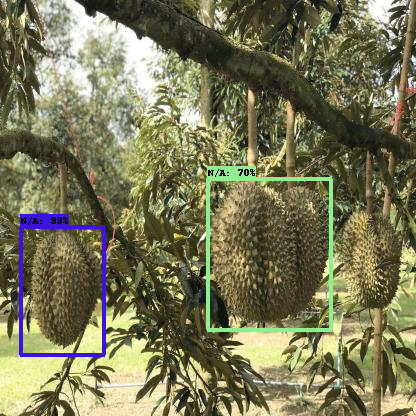

In [ ]:

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'    # Suppress TensorFlow logging (1)
import pathlib
import tensorflow as tf
import cv2
import argparse
from google.colab.patches import cv2_imshow

# Enable GPU dynamic memory allocation
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

# PROVIDE PATH TO IMAGE DIRECTORY
IMAGE_PATHS = '/content/drive/MyDrive/DADS7202/workspace/training_demo/images/test/1_jpg.rf.24fda645c9751b1f97ca006a4c164020.jpg'

# PROVIDE PATH TO MODEL DIRECTORY
PATH_TO_MODEL_DIR = '/content/drive/MyDrive/DADS7202/workspace/training_demo/pre-trained-models/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8'

# PROVIDE PATH TO LABEL MAP
PATH_TO_LABELS = '/content/drive/MyDrive/DADS7202/workspace/training_demo/annotations/label_map.pbtxt'

# PROVIDE THE MINIMUM CONFIDENCE THRESHOLD
MIN_CONF_THRESH = float(0.60)

# LOAD THE MODEL

import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

PATH_TO_SAVED_MODEL = PATH_TO_MODEL_DIR + "/saved_model"

print('Loading model...', end='')
start_time = time.time()

# LOAD SAVED MODEL AND BUILD DETECTION FUNCTION
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)

end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

# LOAD LABEL MAP DATA FOR PLOTTING

category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS,
                                                                    use_display_name=True)

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')   # Suppress Matplotlib warnings

def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.
    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.
    Args:
      path: the file path to the image
    Returns:
      uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))




print('Running inference for {}... '.format(IMAGE_PATHS), end='')

image = cv2.imread(IMAGE_PATHS)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_expanded = np.expand_dims(image_rgb, axis=0)

# The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
input_tensor = tf.convert_to_tensor(image)
# The model expects a batch of images, so add an axis with `tf.newaxis`.
input_tensor = input_tensor[tf.newaxis, ...]

# input_tensor = np.expand_dims(image_np, 0)
detections = detect_fn(input_tensor)

# All outputs are batches tensors.
# Convert to numpy arrays, and take index [0] to remove the batch dimension.
# We're only interested in the first num_detections.
num_detections = int(detections.pop('num_detections'))
detections = {key: value[0, :num_detections].numpy()
               for key, value in detections.items()}
detections['num_detections'] = num_detections

# detection_classes should be ints.
detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

image_with_detections = image.copy()

# SET MIN_SCORE_THRESH BASED ON YOU MINIMUM THRESHOLD FOR DETECTIONS
viz_utils.visualize_boxes_and_labels_on_image_array(
      image_with_detections,
      detections['detection_boxes'],
      detections['detection_classes'],
      detections['detection_scores'],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=0.5,
      agnostic_mode=False)

print('Done')
# DISPLAYS OUTPUT IMAGE
cv2_imshow(image_with_detections)
# CLOSES WINDOW ONCE KEY IS PRESSED

* Pretrain-model Faster R-CNN without training

Loading model...Done! Took 8.798496007919312 seconds
Running inference for /content/drive/MyDrive/DADS7202/workspace/training_demo/images/test/1_jpg.rf.24fda645c9751b1f97ca006a4c164020.jpg... Done


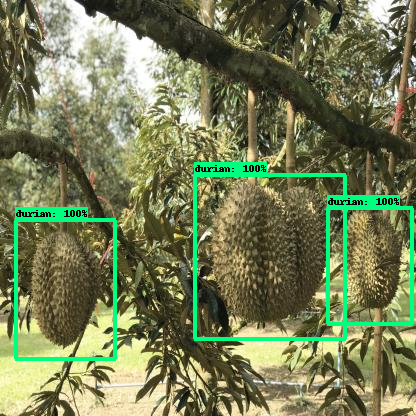

In [ ]:

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'    # Suppress TensorFlow logging (1)
import pathlib
import tensorflow as tf
import cv2
import argparse
from google.colab.patches import cv2_imshow

# Enable GPU dynamic memory allocation
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

# PROVIDE PATH TO IMAGE DIRECTORY
IMAGE_PATHS = '/content/drive/MyDrive/DADS7202/workspace/training_demo/images/test/1_jpg.rf.24fda645c9751b1f97ca006a4c164020.jpg'

# PROVIDE PATH TO MODEL DIRECTORY
PATH_TO_MODEL_DIR = '/content/drive/MyDrive/DADS7202/workspace/training_demo/exported-models/my_model3_faster_R_CNN_1000'

# PROVIDE PATH TO LABEL MAP
PATH_TO_LABELS = '/content/drive/MyDrive/DADS7202/workspace/training_demo/annotations/label_map.pbtxt'

# PROVIDE THE MINIMUM CONFIDENCE THRESHOLD
MIN_CONF_THRESH = float(0.60)

# LOAD THE MODEL

import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

PATH_TO_SAVED_MODEL = PATH_TO_MODEL_DIR + "/saved_model"

print('Loading model...', end='')
start_time = time.time()

# LOAD SAVED MODEL AND BUILD DETECTION FUNCTION
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)

end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

# LOAD LABEL MAP DATA FOR PLOTTING

category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS,
                                                                    use_display_name=True)

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')   # Suppress Matplotlib warnings

def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.
    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.
    Args:
      path: the file path to the image
    Returns:
      uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))




print('Running inference for {}... '.format(IMAGE_PATHS), end='')

image = cv2.imread(IMAGE_PATHS)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_expanded = np.expand_dims(image_rgb, axis=0)

# The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
input_tensor = tf.convert_to_tensor(image)
# The model expects a batch of images, so add an axis with `tf.newaxis`.
input_tensor = input_tensor[tf.newaxis, ...]

# input_tensor = np.expand_dims(image_np, 0)
detections = detect_fn(input_tensor)

# All outputs are batches tensors.
# Convert to numpy arrays, and take index [0] to remove the batch dimension.
# We're only interested in the first num_detections.
num_detections = int(detections.pop('num_detections'))
detections = {key: value[0, :num_detections].numpy()
               for key, value in detections.items()}
detections['num_detections'] = num_detections

# detection_classes should be ints.
detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

image_with_detections = image.copy()

# SET MIN_SCORE_THRESH BASED ON YOU MINIMUM THRESHOLD FOR DETECTIONS
viz_utils.visualize_boxes_and_labels_on_image_array(
      image_with_detections,
      detections['detection_boxes'],
      detections['detection_classes'],
      detections['detection_scores'],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=0.5,
      agnostic_mode=False)

print('Done')
# DISPLAYS OUTPUT IMAGE
cv2_imshow(image_with_detections)
# CLOSES WINDOW ONCE KEY IS PRESSED



---

* Fater R-CNN - 1000 Step

Loading model...Done! Took 8.783716917037964 seconds
Running inference for /content/drive/MyDrive/DADS7202/workspace/training_demo/images/test/1_jpg.rf.24fda645c9751b1f97ca006a4c164020.jpg... Done


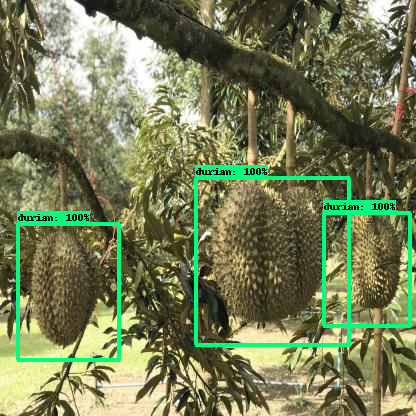

In [ ]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'    # Suppress TensorFlow logging (1)
import pathlib
import tensorflow as tf
import cv2
import argparse
from google.colab.patches import cv2_imshow

# Enable GPU dynamic memory allocation
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

# PROVIDE PATH TO IMAGE DIRECTORY
IMAGE_PATHS = '/content/drive/MyDrive/DADS7202/workspace/training_demo/images/test/1_jpg.rf.24fda645c9751b1f97ca006a4c164020.jpg'

# PROVIDE PATH TO MODEL DIRECTORY
PATH_TO_MODEL_DIR = '/content/drive/MyDrive/DADS7202/workspace/training_demo/exported-models/my_model4_faster_R_CNN_2000'

# PROVIDE PATH TO LABEL MAP
PATH_TO_LABELS = '/content/drive/MyDrive/DADS7202/workspace/training_demo/annotations/label_map.pbtxt'

# PROVIDE THE MINIMUM CONFIDENCE THRESHOLD
MIN_CONF_THRESH = float(0.60)

# LOAD THE MODEL

import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

PATH_TO_SAVED_MODEL = PATH_TO_MODEL_DIR + "/saved_model"

print('Loading model...', end='')
start_time = time.time()

# LOAD SAVED MODEL AND BUILD DETECTION FUNCTION
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)

end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

# LOAD LABEL MAP DATA FOR PLOTTING

category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS,
                                                                    use_display_name=True)

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')   # Suppress Matplotlib warnings

def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.
    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.
    Args:
      path: the file path to the image
    Returns:
      uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))




print('Running inference for {}... '.format(IMAGE_PATHS), end='')

image = cv2.imread(IMAGE_PATHS)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_expanded = np.expand_dims(image_rgb, axis=0)

# The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
input_tensor = tf.convert_to_tensor(image)
# The model expects a batch of images, so add an axis with `tf.newaxis`.
input_tensor = input_tensor[tf.newaxis, ...]

# input_tensor = np.expand_dims(image_np, 0)
detections = detect_fn(input_tensor)

# All outputs are batches tensors.
# Convert to numpy arrays, and take index [0] to remove the batch dimension.
# We're only interested in the first num_detections.
num_detections = int(detections.pop('num_detections'))
detections = {key: value[0, :num_detections].numpy()
               for key, value in detections.items()}
detections['num_detections'] = num_detections

# detection_classes should be ints.
detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

image_with_detections = image.copy()

# SET MIN_SCORE_THRESH BASED ON YOU MINIMUM THRESHOLD FOR DETECTIONS
viz_utils.visualize_boxes_and_labels_on_image_array(
      image_with_detections,
      detections['detection_boxes'],
      detections['detection_classes'],
      detections['detection_scores'],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=0.5,
      agnostic_mode=False)

print('Done')
# DISPLAYS OUTPUT IMAGE
cv2_imshow(image_with_detections)
# CLOSES WINDOW ONCE KEY IS PRESSED